# Explorative Datenanalyse mit Wordclouds von Reden der Bundesregierung

## Imports

In [52]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px

from wordcloud import WordCloud
from collections import Counter

%matplotlib inline

## Read Data

In [86]:
df = pd.read_pickle('../data/reden-bundesregierung-preprocessed.p')

In [93]:
# typecasting von list zu str

for column in ['tokens', 'lemmata', 'PER', 'ORG', 'LOC', 'MISC', 'NOUN', 'VERB', 'ADJ']:
    df.loc[:, f'{column}_as_string'] = [','.join(map(str, token)).lower() for token in df.loc[:, column]]

In [94]:
df.head(3).T

,0,1,2
person,Gerhard Schröder,Julian Nida-Rümelin,Gerhard Schröder
titel,Rede des Bundeskanzlers zur Eröffnung der 52. ...,Redebeitrag von Staatsminister Nida-Rümelin in...,Interview mit Bundeskanzler Schröder in 'Berli...
datum,2002-02-06 00:00:00,2002-02-01 00:00:00,2002-04-14 00:00:00
untertitel,"Man kann diese Filmfestspiele nicht eröffnen, ...","""Ich bin der Auffassung, wir müssen nicht nur ...",In dem Interview äußert sich Bundeskanzler Sch...
url,http://archiv.bundesregierung.de/bpaexport/red...,http://archiv.bundesregierung.de/bpaexport/red...,http://archiv.bundesregierung.de/bpaexport/red...
anrede,"Sehr geehrte Frau Nair, liebe Mitglieder der J...",Meine sehr geehrten Damen und Herren!,NaN
rohtext,"es ist angekündigt worden, man sollte im Beruf...","Frau Präsidentin! An Sie gerichtet, Herr Börn...",Frage (Peter Hahne): Bevor wir uns über den Au...
ort,None,None,None
tokens,"[es, ist, angekündigt, worden, man, sollte, im...","[Frau, Präsidentin, , An, Sie, gerichtet, Her...","[Frage, Peter, Hahne, Bevor, wir, uns, über, d..."
ntokens,1911,1319,1512


In [95]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2983 entries, 0 to 2982
Data columns (total 27 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   person             2983 non-null   object        
 1   titel              2982 non-null   object        
 2   datum              2983 non-null   datetime64[ns]
 3   untertitel         2088 non-null   object        
 4   url                2983 non-null   object        
 5   anrede             1447 non-null   object        
 6   rohtext            2983 non-null   object        
 7   ort                690 non-null    object        
 8   tokens             2983 non-null   object        
 9   ntokens            2983 non-null   int64         
 10  lemmata            2983 non-null   object        
 11  PER                2983 non-null   object        
 12  ORG                2983 non-null   object        
 13  LOC                2983 non-null   object        
 14  MISC    

In [96]:
df.columns

Index(['person', 'titel', 'datum', 'untertitel', 'url', 'anrede', 'rohtext',
       'ort', 'tokens', 'ntokens', 'lemmata', 'PER', 'ORG', 'LOC', 'MISC',
       'NOUN', 'VERB', 'ADJ', 'tokens_as_string', 'lemmata_as_string',
       'PER_as_string', 'ORG_as_string', 'LOC_as_string', 'MISC_as_string',
       'NOUN_as_string', 'VERB_as_string', 'ADJ_as_string'],
      dtype='object')

# Wordcloud des Gesamtkorpus

## Stopwords

In [6]:
with open('../data/stopwords.txt', 'r', encoding='utf8') as f:
    stopwords = f.read().splitlines()

In [49]:
new_stop_words = ['herren', 'herr', 'damen', 'dame', 'herrn']
stopwords = [*stopwords, *new_stop_words]

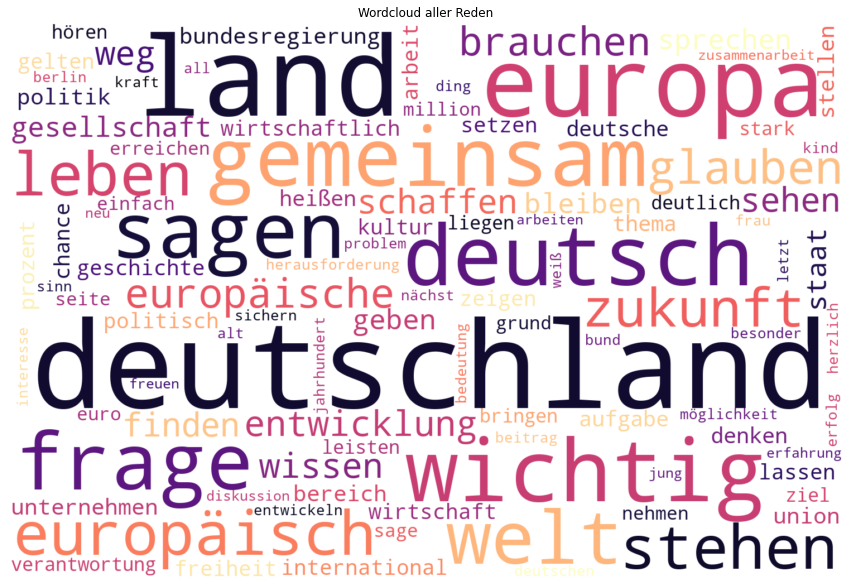

In [97]:
wc = WordCloud(width=1500, height=1000,
        random_state=42,
        background_color='white',
        colormap='magma',
        stopwords=stopwords,
        collocations=False,  # Bigrams werden nicht dargestellt
        max_words=100)        # Anzahl der Worte, die dargestellt werden sollen


wc.generate(df.loc[:, 'lemmata_as_string'].str.cat(sep=' ')) 

plt.figure(figsize=(15, 15))
plt.imshow(wc, interpolation="bilinear")
plt.title('Wordcloud aller Reden')
plt.axis('off')
# plt.show()
plt.savefig('../img/Wordcloud-gesamt', dpi=300, bbox_inches='tight');

## Wordclouds der Jahre 2000-2017

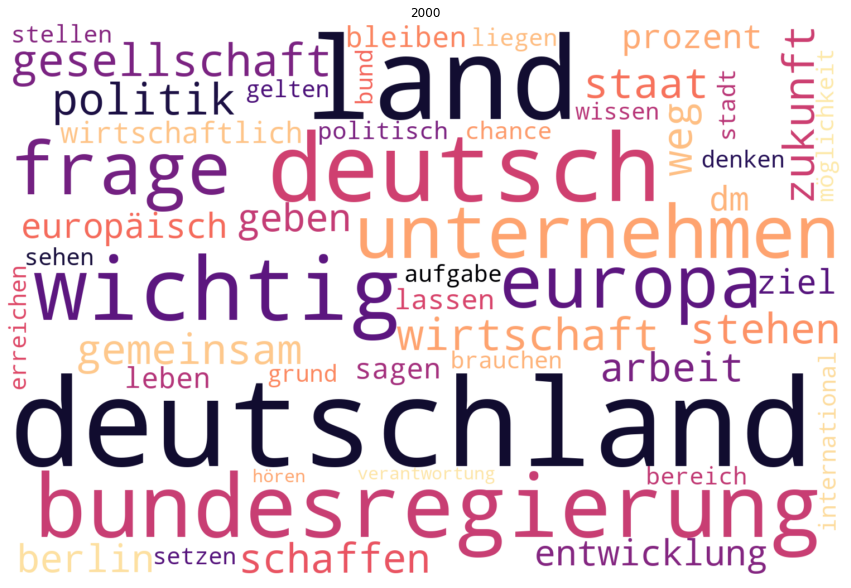

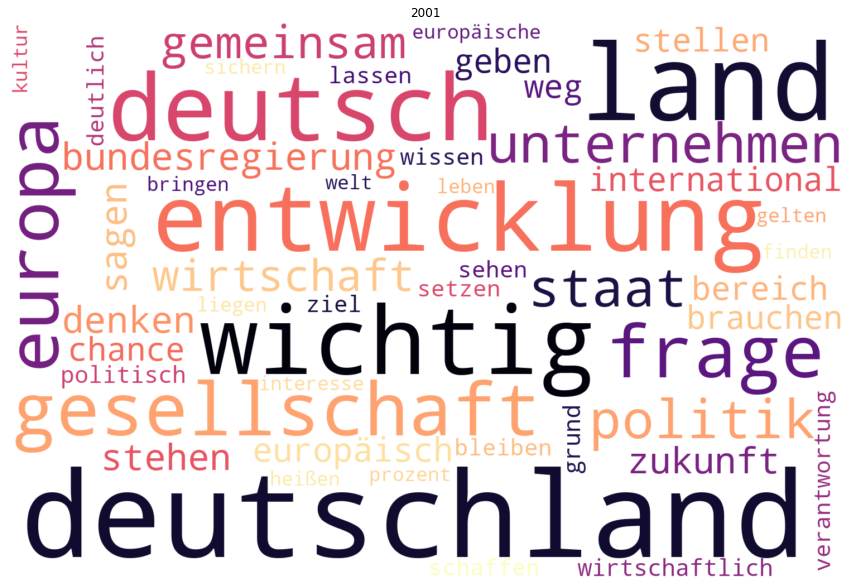

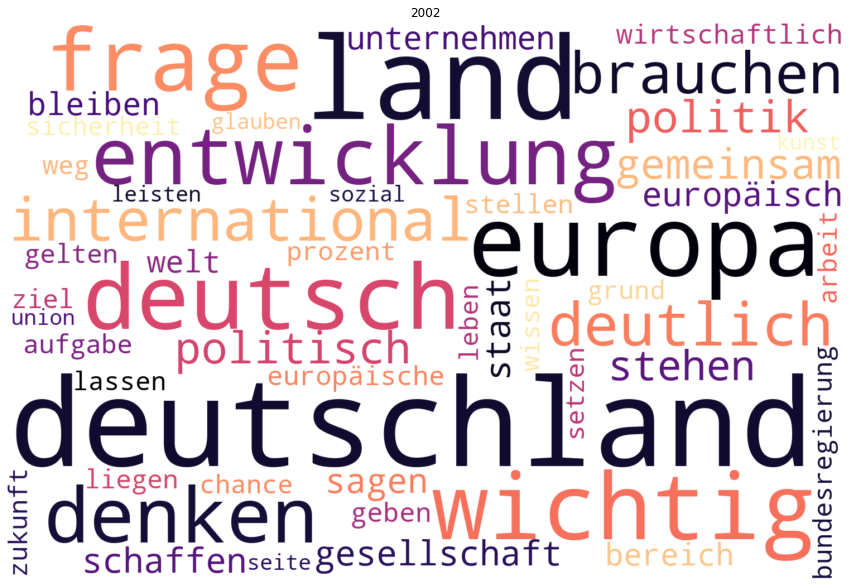

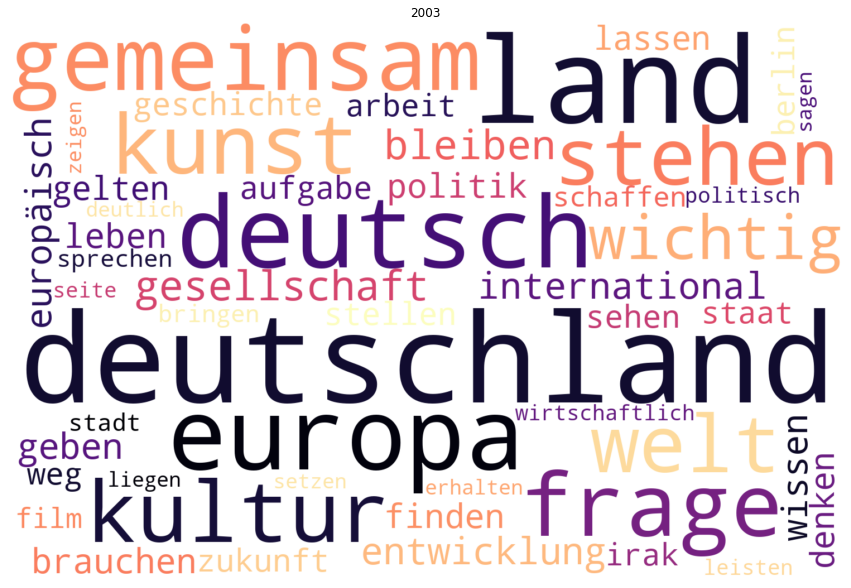

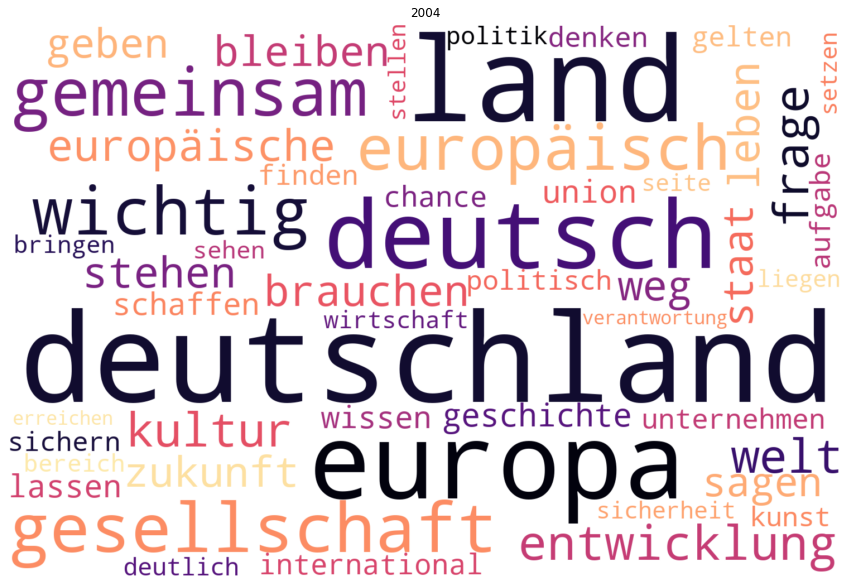

...

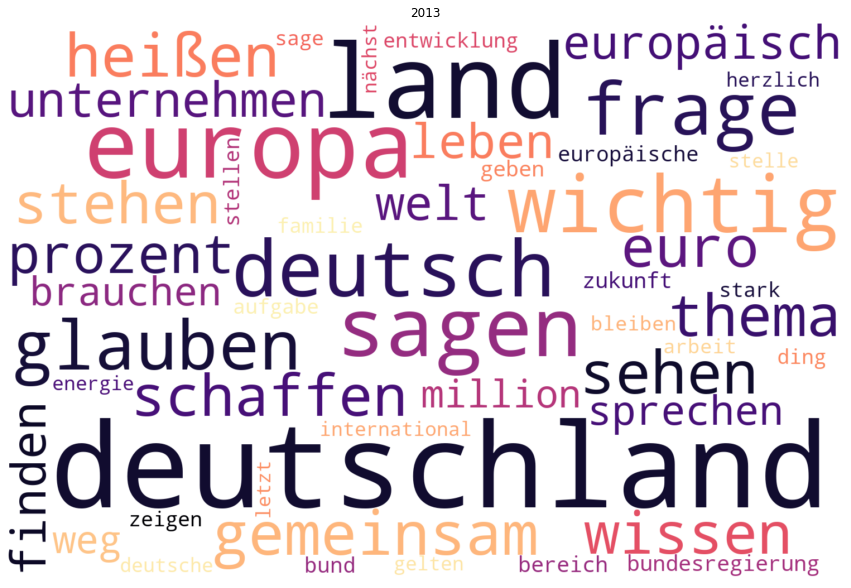

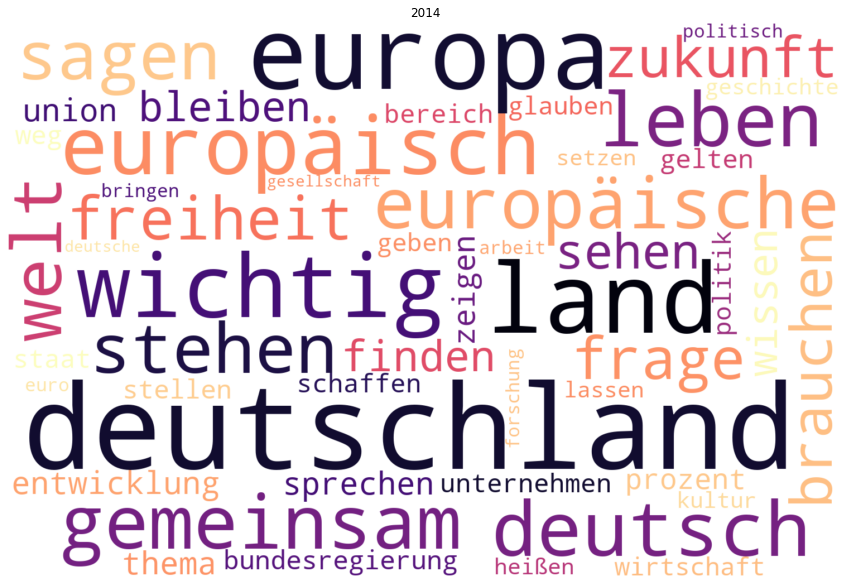

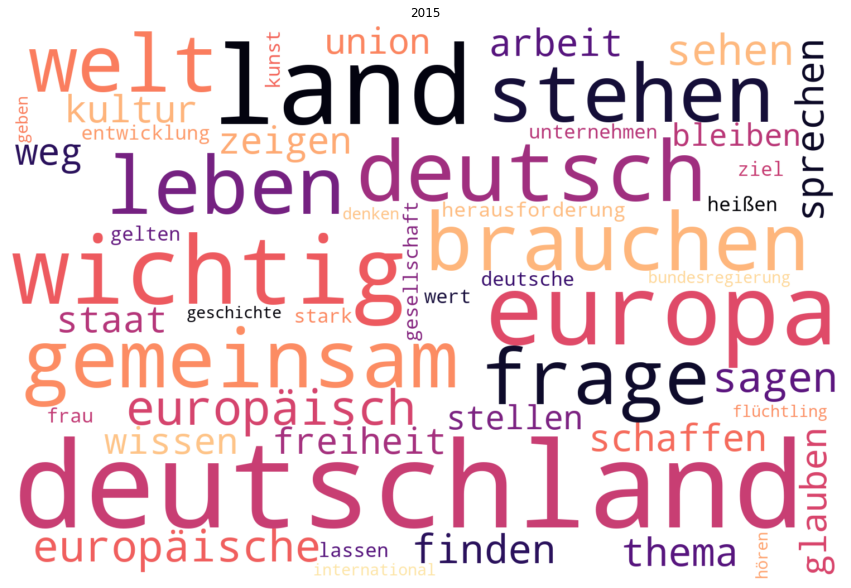

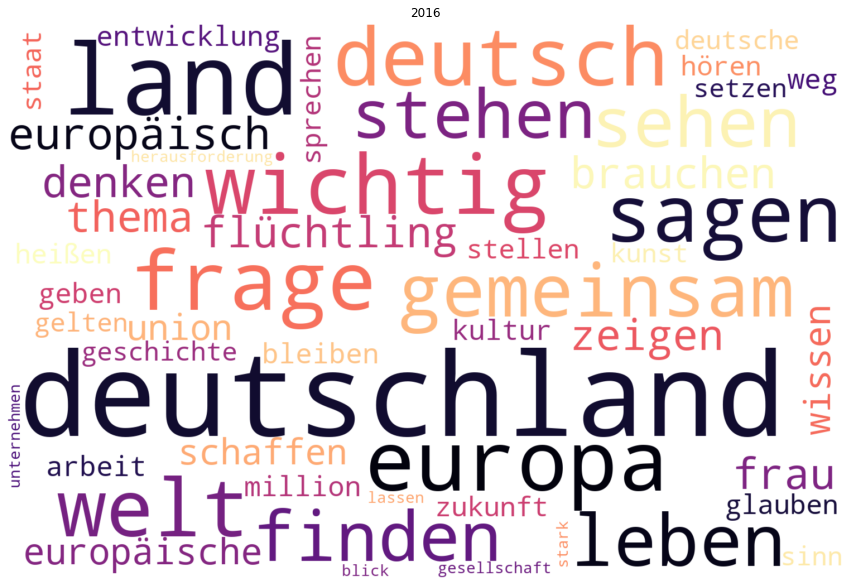

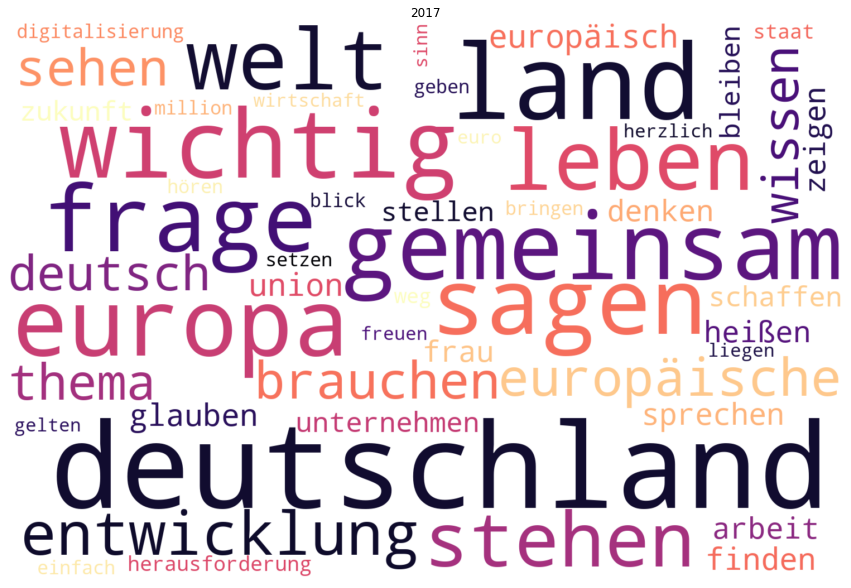

In [98]:
years = list(range(2000,2018))

for year in years:
    mask = df.loc[:, 'datum'].dt.to_period('Y') == str(year)

    wc = WordCloud(width=1500, height=1000,
            random_state=42,
            background_color='white',
            colormap='magma',
            stopwords=stopwords,
            collocations=False,  # Bigrams werden nicht dargestellt
            max_words=50)        # Anzahl der Worte, die dargestellt werden sollen


    wc.generate(df.loc[mask, 'lemmata_as_string'].str.cat(sep=' ')) 
    
    plt.figure(figsize=(15, 15))
    plt.imshow(wc, interpolation="bilinear")
    plt.title(str(year))
    plt.axis('off')
    plt.show()

# Wordclouds der Named Entities

## PER und ORG

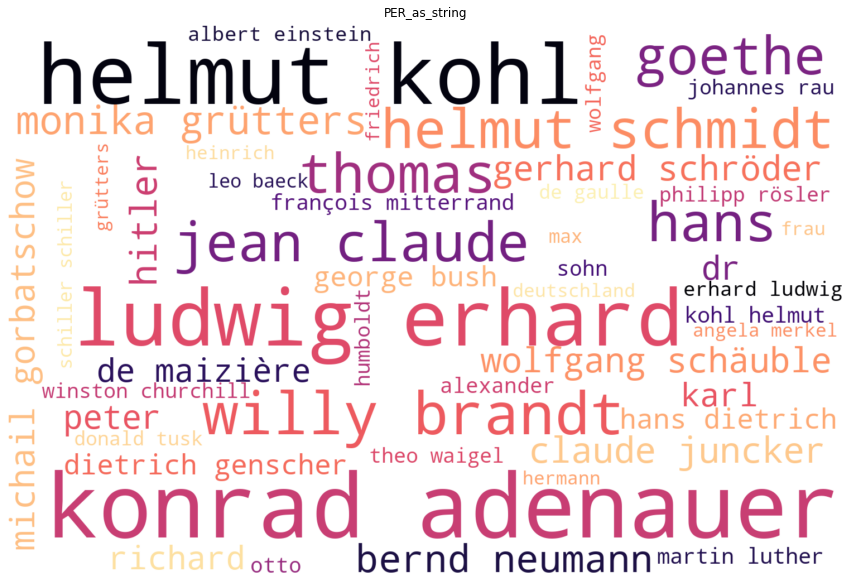

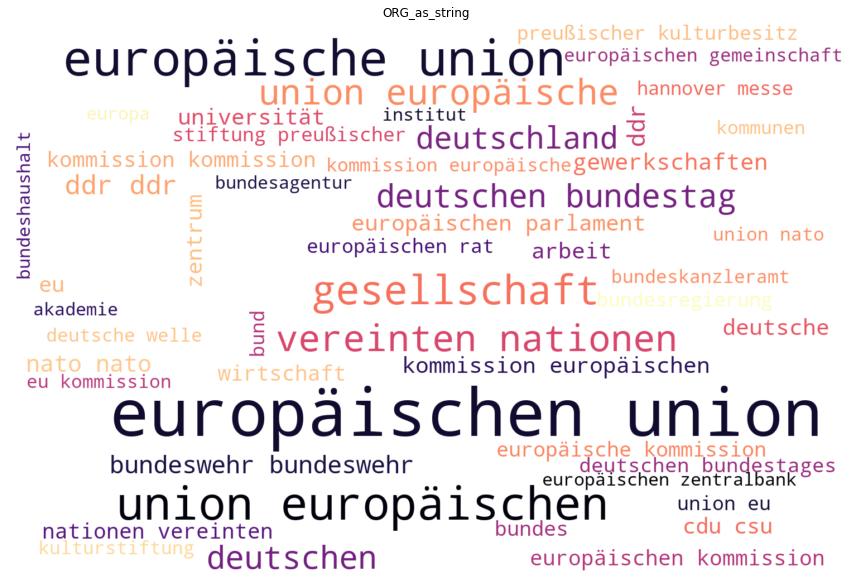

In [99]:
for entity in ['PER_as_string', 'ORG_as_string' ]: # , 'LOC', 'MISC']:
    
    wc = WordCloud(width=1500, height=1000,
            random_state=42,
            background_color='white',
            colormap='magma',
            stopwords=stopwords,
            collocations=True,  # Bigrams werden  dargestellt
            max_words=50)        # Anzahl der Worte, die dargestellt werden sollen


    wc.generate(df.loc[:, entity].str.cat(sep=' ')) 
    
    plt.figure(figsize=(15, 15))
    plt.imshow(wc, interpolation="bilinear")
    plt.title(entity)
    plt.axis('off')
    plt.show()

## LOC und MISC

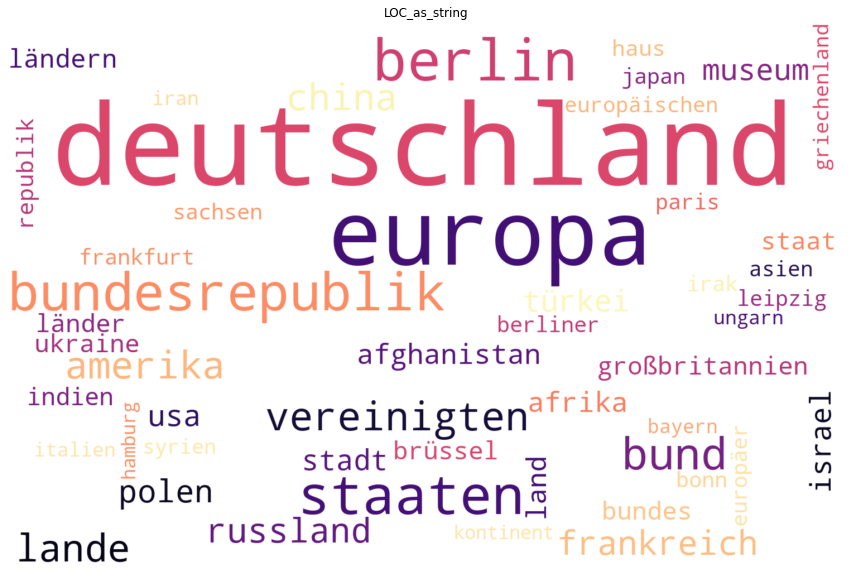

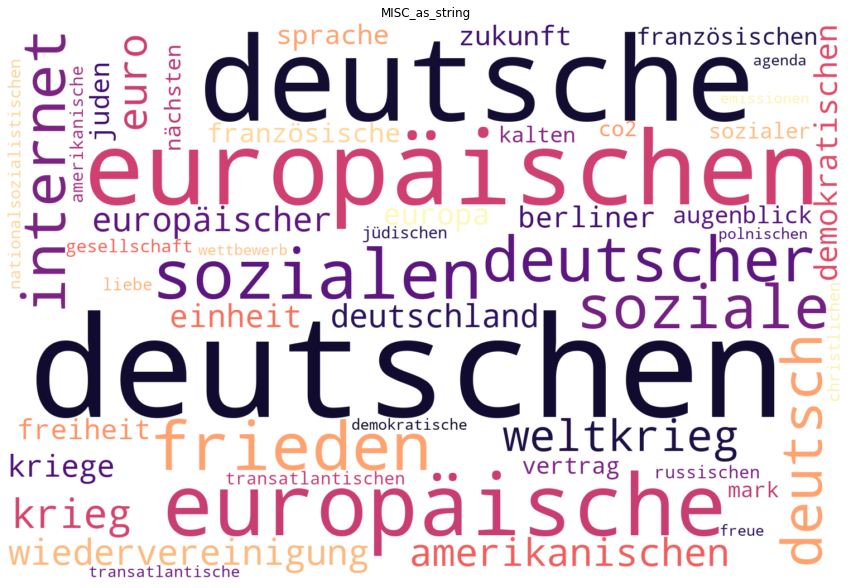

In [100]:
for entity in ['LOC_as_string', 'MISC_as_string']:
    
    wc = WordCloud(width=1500, height=1000,
            random_state=42,
            background_color='white',
            colormap='magma',
            stopwords=stopwords,
            collocations=False,  # Bigrams werden nicht dargestellt
            max_words=50)        # Anzahl der Worte, die dargestellt werden sollen


    wc.generate(df.loc[:, entity].str.cat(sep=' ')) 
    
    plt.figure(figsize=(15, 15))
    plt.imshow(wc, interpolation="bilinear")
    plt.title(entity)
    plt.axis('off')
    plt.show()

## Personen nach Jahren

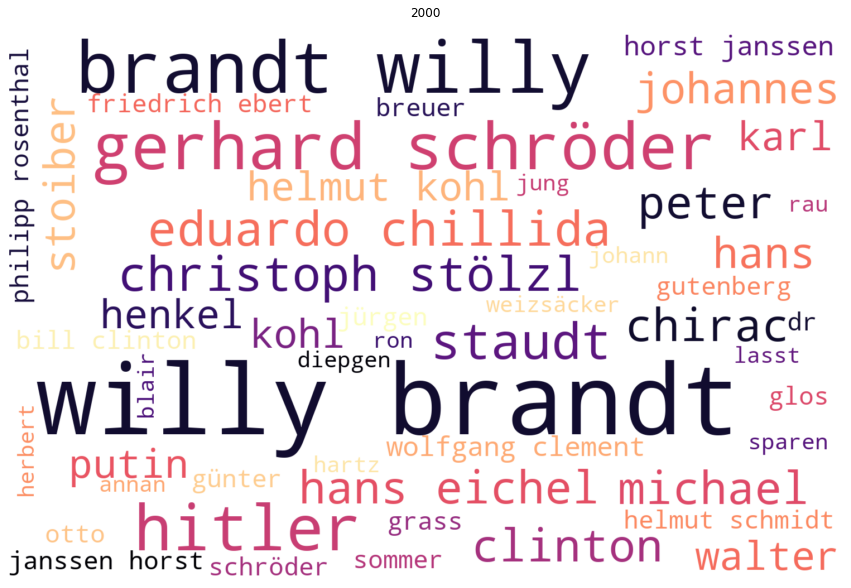

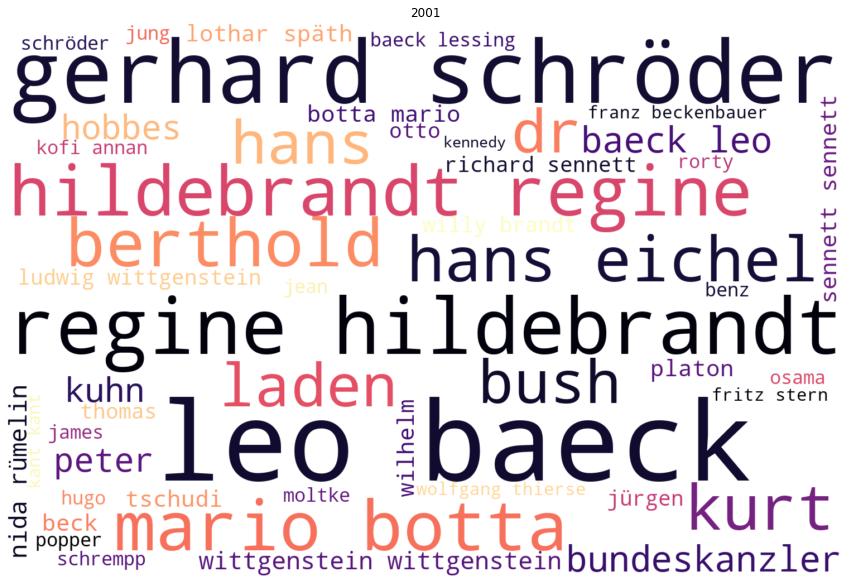

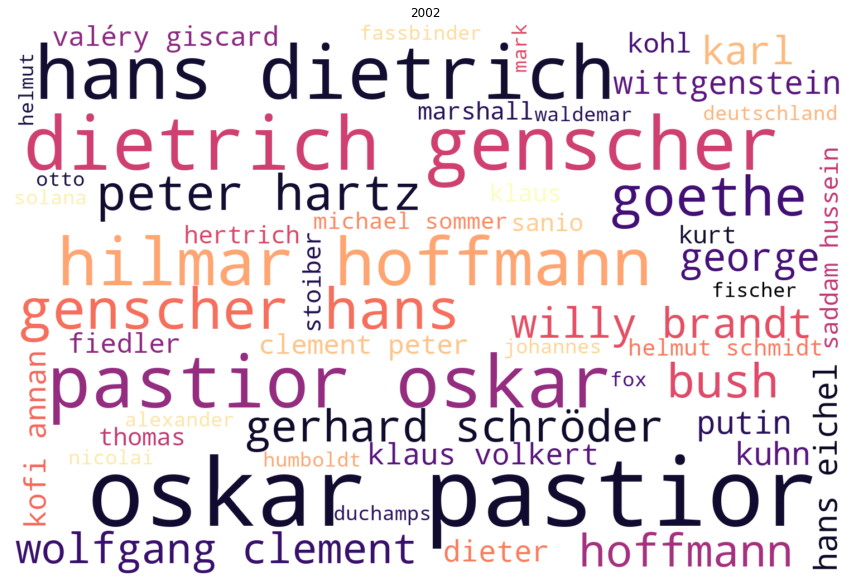

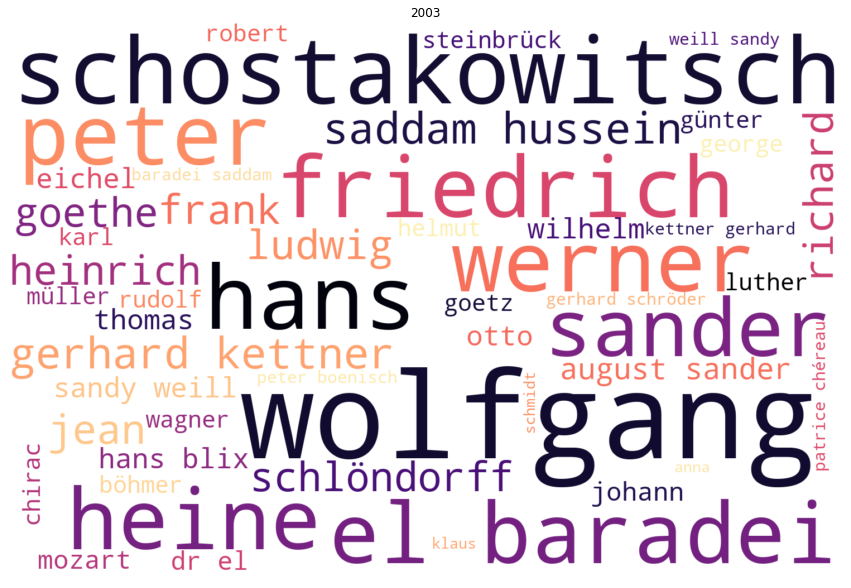

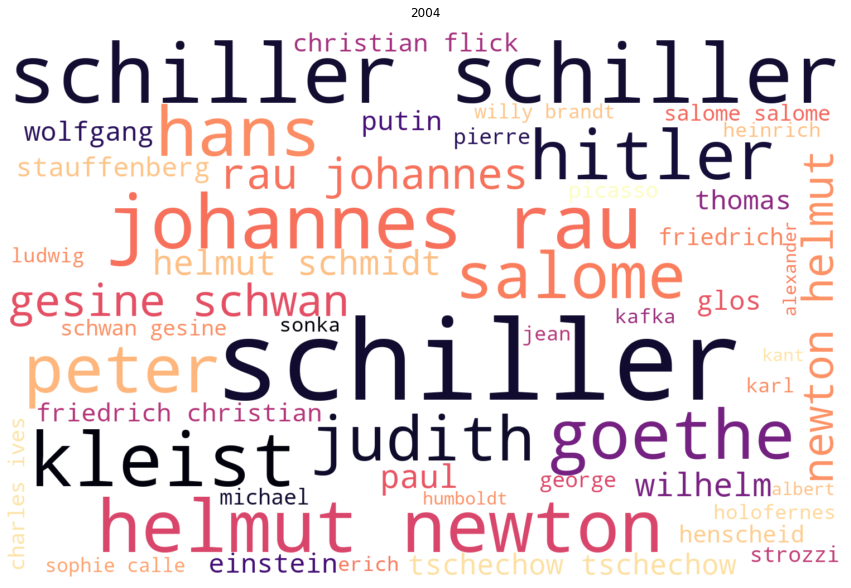

...

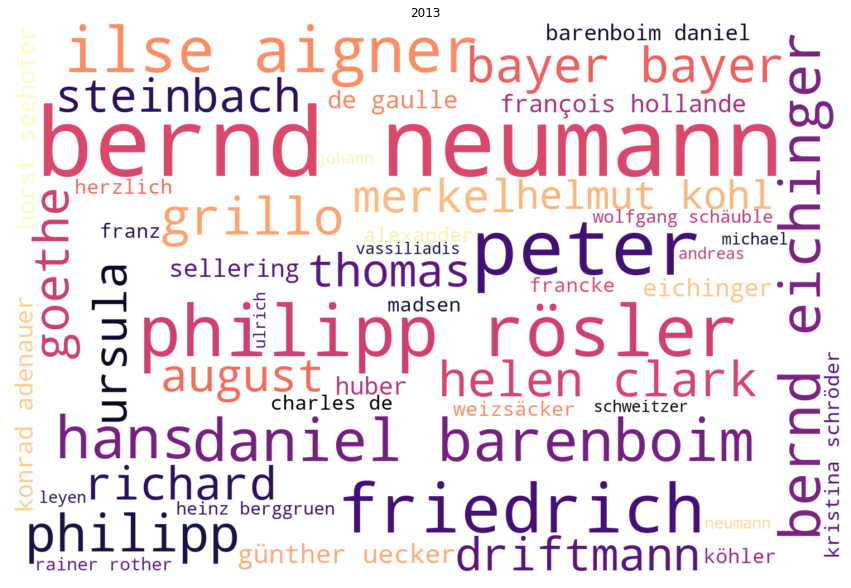

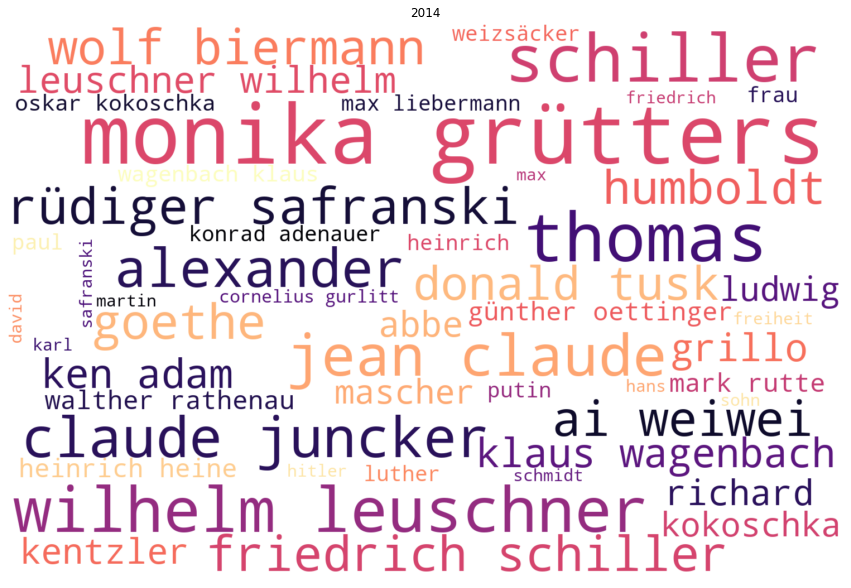

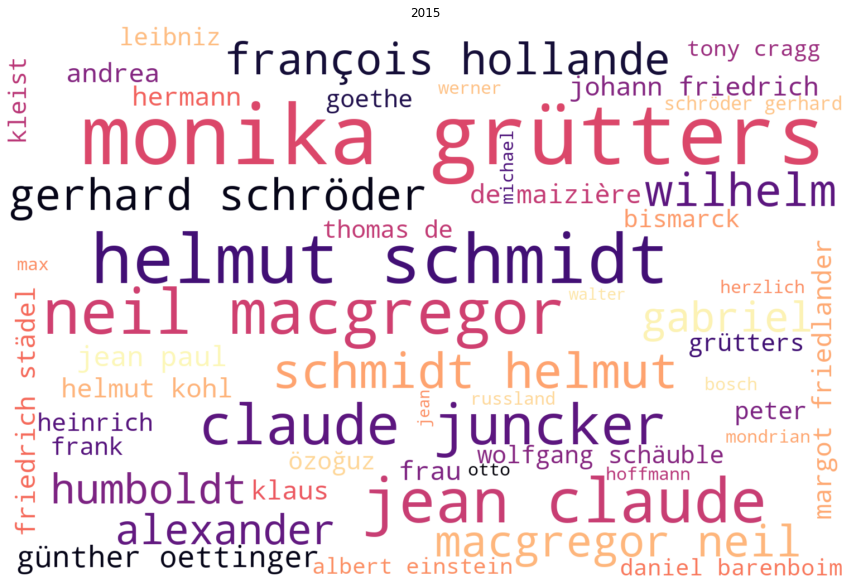

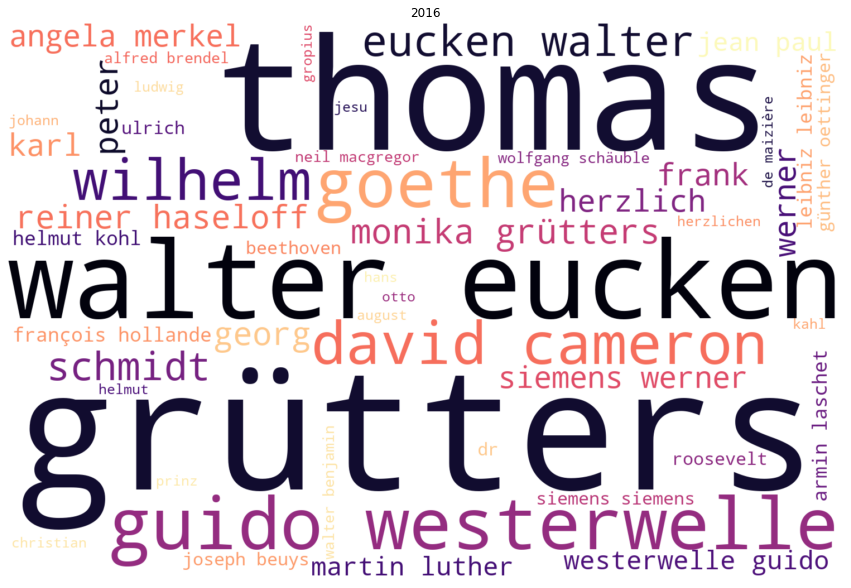

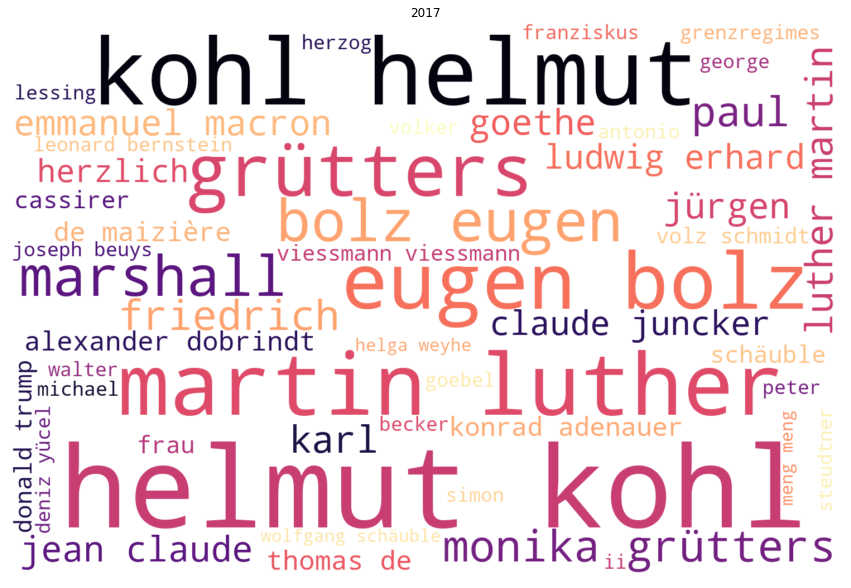

In [101]:
years = list(range(2000,2018))

for year in years:
    mask = df.loc[:, 'datum'].dt.to_period('Y') == str(year)

    wc = WordCloud(width=1500, height=1000,
            random_state=42,
            background_color='white',
            colormap='magma',
            stopwords=stopwords,
            collocations=True,  # Bigrams werden nicht dargestellt
            max_words=50)        # Anzahl der Worte, die dargestellt werden sollen


    wc.generate(df.loc[mask, 'PER_as_string'].str.cat(sep=' ')) 
    
    plt.figure(figsize=(15, 15))
    plt.imshow(wc, interpolation="bilinear")
    plt.title(str(year))
    plt.axis('off')
    plt.show()

# Wordclouds Part of Speech

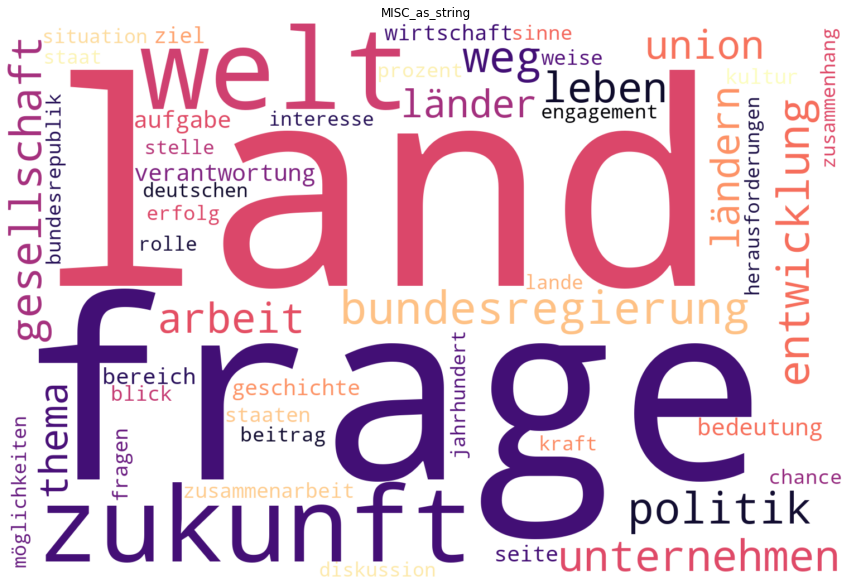

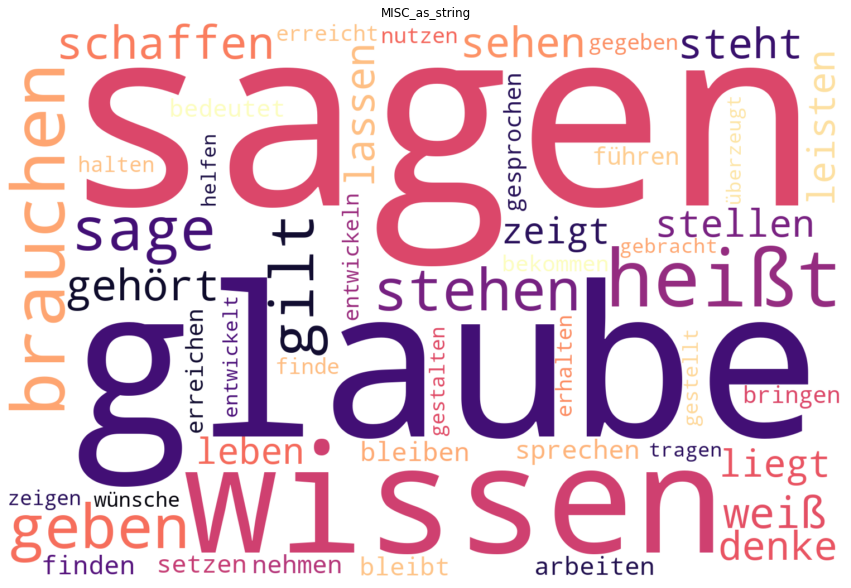

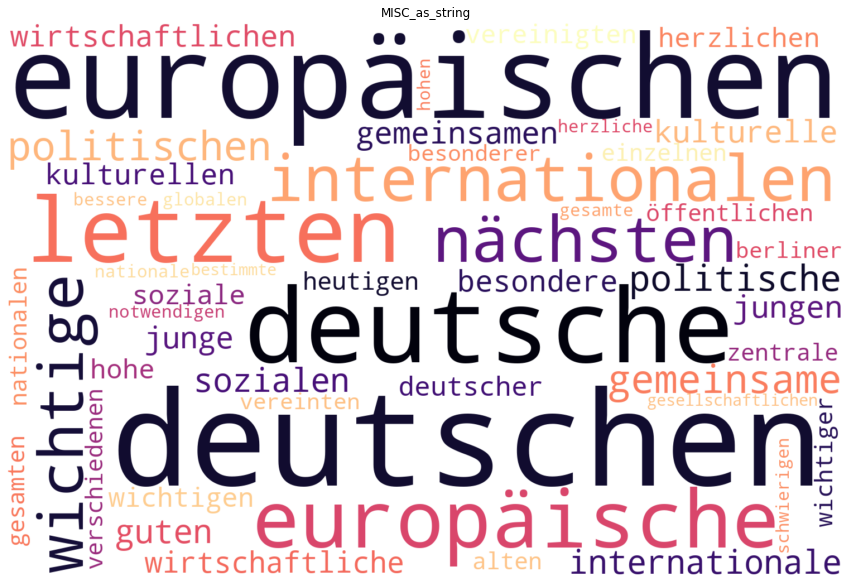

In [102]:
for pos_tag in ['NOUN_as_string', 'VERB_as_string', 'ADJ_as_string' ]:
    
    wc = WordCloud(width=1500, height=1000,
            random_state=42,
            background_color='white',
            colormap='magma',
            stopwords=stopwords,
            collocations=True,  # Bigrams werden  dargestellt
            max_words=50)        # Anzahl der Worte, die dargestellt werden sollen


    wc.generate(df.loc[:, pos_tag].str.cat(sep=' ')) 
    
    plt.figure(figsize=(15, 15))
    plt.imshow(wc, interpolation="bilinear")
    plt.title(entity)
    plt.axis('off')
    plt.show()

# Barcharts mit Plotly

In [104]:
columns = ['PER', 'ORG', 'LOC', 'MISC','NOUN', 'VERB', 'ADJ' ]

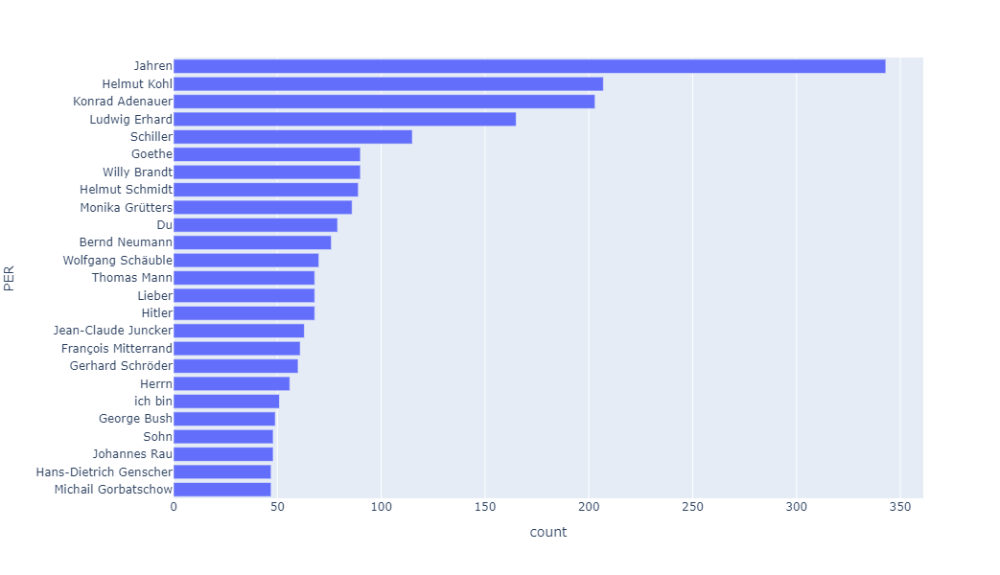

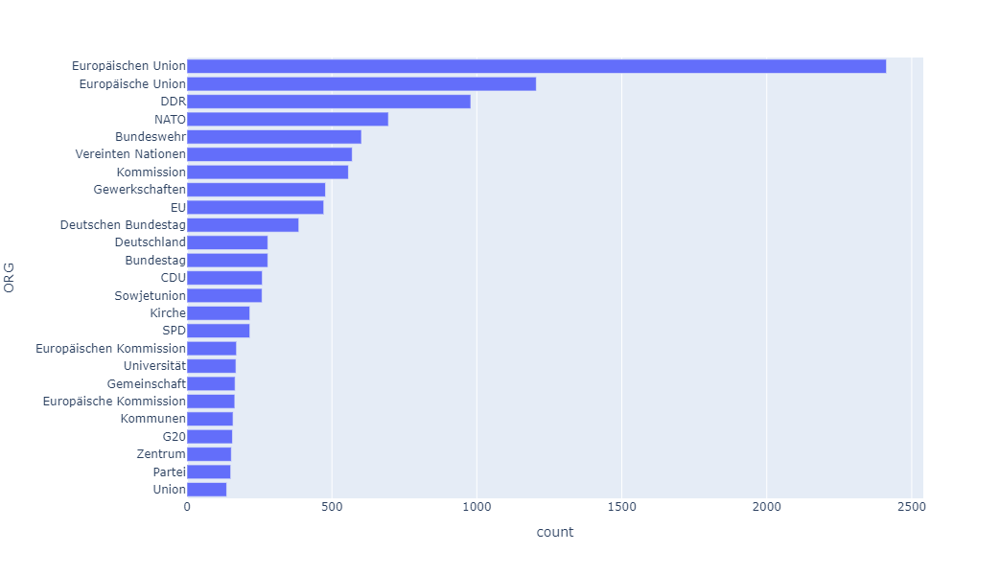

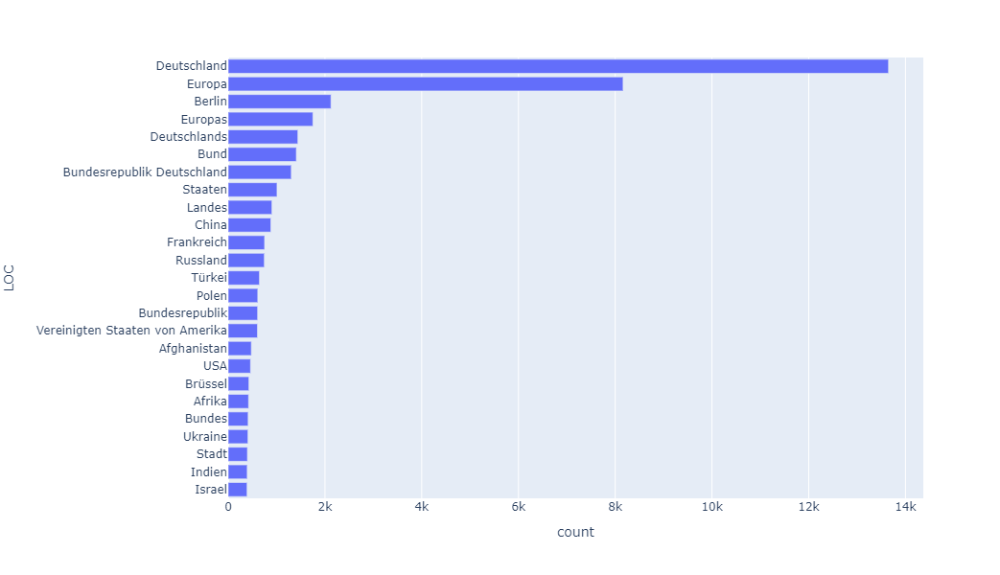

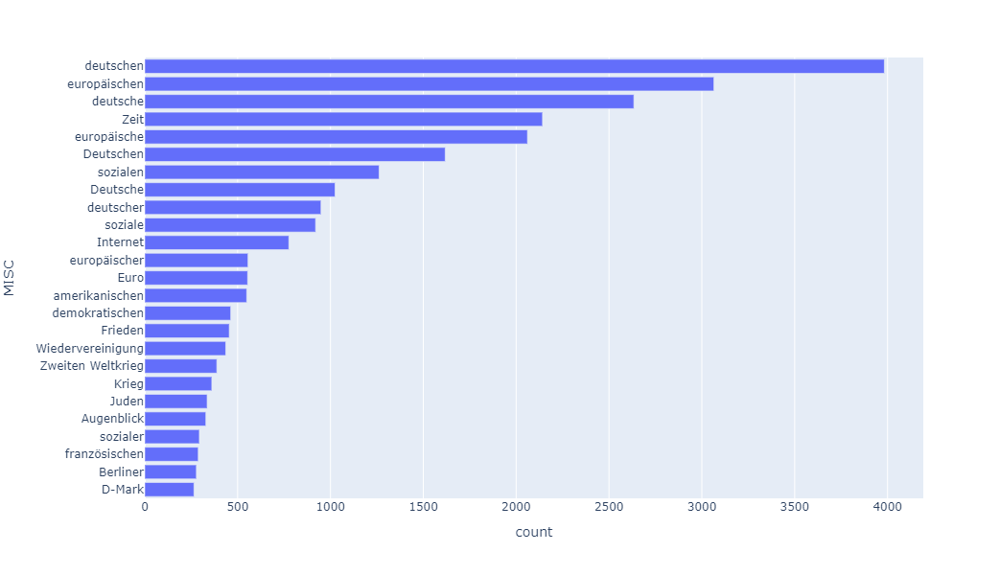

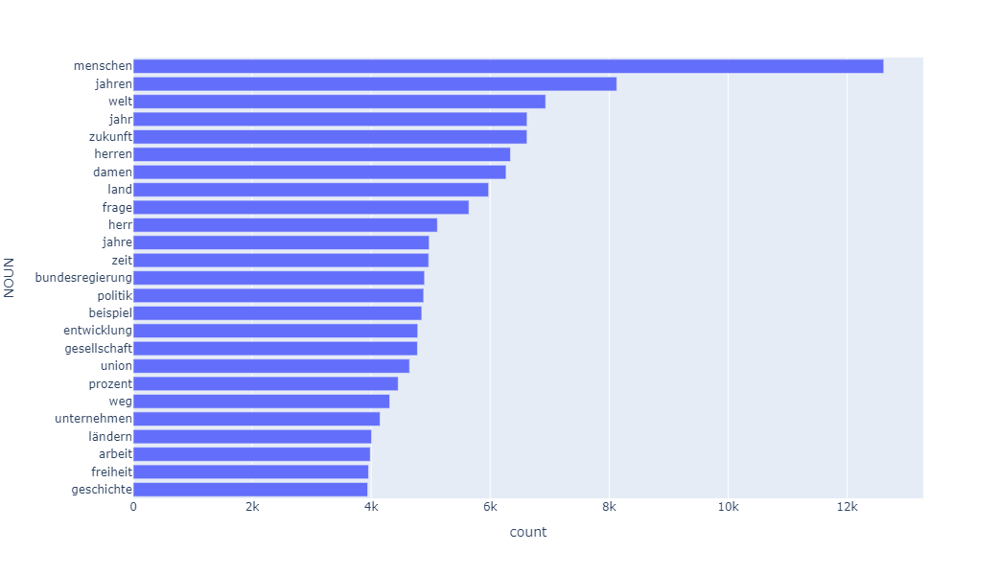

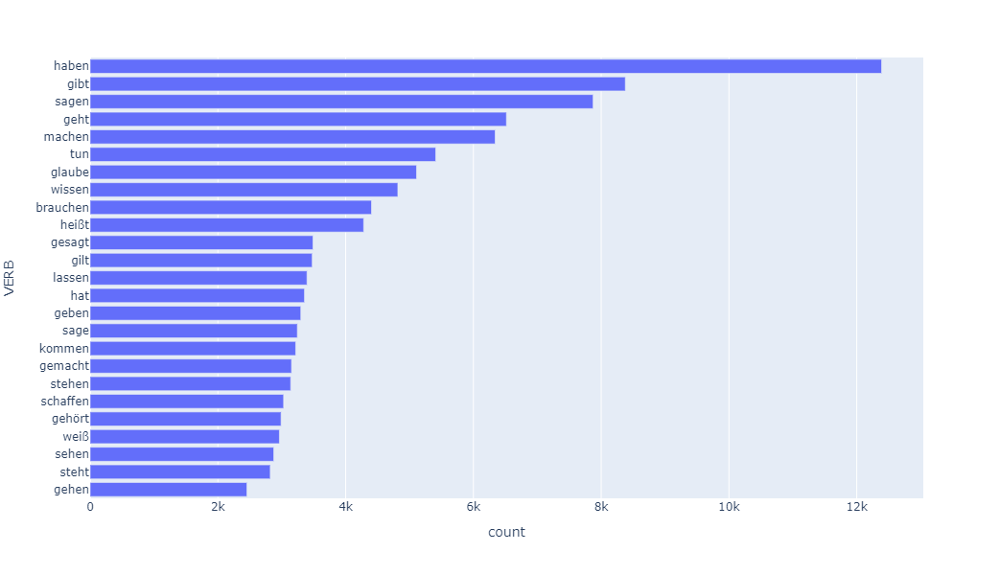

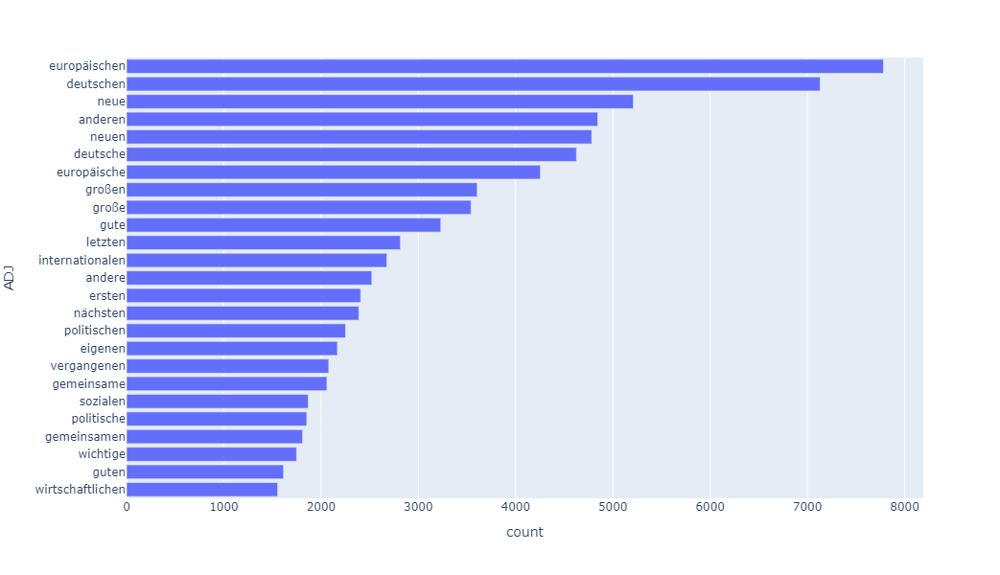

In [114]:
for column in columns:
    column_ser = df.loc[:, column]
    column_list = [ i for x in column_ser for i in x ]
    counter = Counter(column_list)

    df_column = pd.DataFrame.from_dict(counter, orient='index').reset_index()
    df_column = df_column.rename(columns={'index': column, 0: 'count'})
    df_column = df_column.sort_values(ascending=False, by='count')

    fig = px.bar(df_column.head(25).sort_values(ascending=True, by='count'),
                 x='count',
                 y=column,
                 width=800,
                 height=600)
    fig.show()